2. Utilizando as bases de treinamento e testes disponivel no link: https://www.kaggle.com/c/houseprices-advanced-regression-techniques/data, apresente duas solucoes de aprendizagem de
maquina que consigam baixas taxas de erro medio (prove que esse e o menor valor que voce
pôde encontrar).
Dica:

• Teste com dois algoritmos de aprendizagem de maquina para identificar os que
apresentam melhores resultados; 

### Imports 

In [1]:
import pandas as pd
import numpy as np
from sklearn import preprocessing
import matplotlib.pyplot as plt
%matplotlib inline
from sklearn.metrics import accuracy_score
import seaborn as sns
from sklearn.neighbors import KNeighborsRegressor
sns.set(style="whitegrid")
import warnings
warnings.filterwarnings("ignore")
warnings.filterwarnings("ignore", category=DeprecationWarning)
from sklearn.preprocessing import Imputer
imputer = Imputer(strategy="median")
from sklearn.svm import SVR

#Abrindo as bases
dataset_train = pd.read_csv("train.csv")
dataset_test = pd.read_csv("test.csv")
#Configurando a máx visualização das bases
print(pd.options.display.max_columns, pd.options.display.max_rows)
pd.options.display.max_columns = 85
pd.options.display.max_rows = 1470
output_1 = pd.read_csv("sample_submission.csv")
output_1 = output_1.drop(["Id"], axis=1)

20 60


### 1. Análise dos dados

In [2]:
dataset_train

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2003,2003,Gable,CompShg,VinylSd,VinylSd,BrkFace,196.0,Gd,TA,PConc,Gd,TA,No,GLQ,706,Unf,0,150,856,GasA,Ex,Y,SBrkr,856,854,0,1710,1,0,2,1,3,1,Gd,8,Typ,0,NaN,Attchd,2003.0,RFn,2,548,TA,TA,Y,0,61,0,0,0,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm,1Fam,1Story,6,8,1976,1976,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,CBlock,Gd,TA,Gd,ALQ,978,Unf,0,284,1262,GasA,Ex,Y,SBrkr,1262,0,0,1262,0,1,2,0,3,1,TA,6,Typ,1,TA,Attchd,1976.0,RFn,2,460,TA,TA,Y,298,0,0,0,0,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,2Story,7,5,2001,2002,Gable,CompShg,VinylSd,VinylSd,BrkFace,162.0,Gd,TA,PConc,Gd,TA,Mn,GLQ,486,Unf,0,434,920,GasA,Ex,Y,SBrkr,920,866,0,1786,1,0,2,1,3,1,Gd,6,Typ,1,TA,Attchd,2001.0,RFn,2,608,TA,TA,Y,0,42,0,0,0,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,2Story,7,5,1915,1970,Gable,CompShg,Wd Sdng,Wd Shng,None,0.0,TA,TA,BrkTil,TA,Gd,No,ALQ,216,Unf,0,540,756,GasA,Gd,Y,SBrkr,961,756,0,1717,1,0,1,0,3,1,Gd,7,Typ,1,Gd,Detchd,1998.0,Unf,3,642,TA,TA,Y,0,35,272,0,0,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,FR2,Gtl,NoRidge,Norm,Norm,1Fam,2Story,8,5,2000,2000,Gable,CompShg,VinylSd,VinylSd,BrkFace,350.0,Gd,TA,PConc,Gd,TA,Av,GLQ,655,Unf,0,490,1145,GasA,Ex,Y,SBrkr,1145,1053,0,2198,1,0,2,1,4,1,Gd,9,Typ,1,TA,Attchd,2000.0,RFn,3,836,TA,TA,Y,192,84,0,0,0,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000
5,6,50,RL,85.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Mitchel,Norm,Norm,1Fam,1.5Fin,5,5,1993,1995,Gable,CompShg,VinylSd,VinylSd,None,0.0,TA,TA,Wood,Gd,TA,No,GLQ,732,Unf,0,64,796,GasA,Ex,Y,SBrkr,796,566,0,1362,1,0,1,1,1,1,TA,5,Typ,0,NaN,Attchd,1993.0,Unf,2,480,TA,TA,Y,40,30,0,320,0,0,NaN,MnPrv,Shed,700,10,2009,WD,Normal,143000
6,7,20,RL,75.0,10084,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,1Fam,1Story,8,5,2004,2005,Gable,CompShg,VinylSd,VinylSd,Stone,186.0,Gd,TA,PConc,Ex,TA,Av,GLQ,1369,Unf,0,317,1686,GasA,Ex,Y,SBrkr,1694,0,0,1694,1,0,2,0,3,1,Gd,7,Typ,1,Gd,Attchd,2004.0,RFn,2,636,TA,TA,Y,255,57,0,0,0,0,NaN,NaN,NaN,0,8,2007,WD,Normal,307000
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NWAmes,PosN,Norm,1Fam,2Story,7,6,1973,1973,Gable,CompShg,HdBoard,HdBoard,Stone,240.0,TA,TA,CBlock,Gd,TA,Mn,ALQ,859,BLQ,32,216,1107,GasA,Ex,Y,SBrkr,1107,983,0,2090,1,0,2,1,3,1,TA,7,Typ,2,TA,Attchd,1973.0,RFn,2,484,TA,TA,Y,235,204,228,0,0,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
8,9,50,RM,51.0,6120,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,OldTown,Artery,Norm,1Fam,1.5Fin,7,5,1931,1950,Gable,CompShg,BrkFace,Wd Shng,None,0.0,TA,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,952,952,GasA,Gd,Y,FuseF,1022,752,0,1774,0,0,2,0,2,2,TA,8,Min1,2,TA,Detchd,1931.0,Unf,2,468,Fa,TA,Y,90,0,205,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Abnorml,129900
9,10,190,RL,50.0,7420,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,BrkSide,Artery,Artery,2fmCon,1.5Unf,5,6,1939,1950,Gable,CompShg,MetalSd,MetalSd,None,0.0,TA,TA,BrkTil,TA,TA,No,GLQ,851,Unf,0,140,991,Gas

In [3]:
dataset_test.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
count,1459.000000,1459.000000,1232.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1444.000000,1458.000000,1458.000000,1458.000000,1458.000000,1459.000000,1459.000000,1459.000000,1459.000000,1457.000000,1457.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.00000,1381.000000,1458.000000,1458.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000,1459.000000
mean,2190.000000,57.378341,68.580357,9819.161069,6.078821,5.553804,1971.357779,1983.662783,100.709141,439.203704,52.619342,554.294925,1046.117970,1156.534613,325.967786,3.543523,1486.045922,0.434454,0.065202,1.570939,0.377656,2.854010,1.042495,6.385195,0.58122,1977.721217,1.766118,472.768861,93.174777,48.313914,24.243317,1.794380,17.064428,1.744345,58.167923,6.104181,2007.769705
std,421.321334,42.746880,22.376841,4955.517327,1.436812,1.113740,30.390071,21.130467,177.625900,455.268042,176.753926,437.260486,442.898624,398.165820,420.610226,44.043251,485.566099,0.530648,0.252468,0.555190,0.503017,0.829788,0.208472,1.508895,0.64742,26.431175,0.775945,217.048611,127.744882,68.883364,67.227765,20.207842,56.609763,30.491646,630.806978,2.722432,1.301740
min,1461.000000,20.000000,21.000000,1470.000000,1.000000,1.000000,1879.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,407.000000,0.000000,0.000000,407.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,0.00000,1895.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000
25%,1825.500000,20.000000,58.000000,7391.000000,5.000000,5.000000,1953.000000,1963.000000,0.000000,0.000000,0.000000,219.250000,784.000000,873.500000,0.000000,0.000000,1117.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.00000,1959.000000,1.000000,318.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,4.000000,2007.000000
50%,2190.000000,50.000000,67.000000,9399.000000,6.000000,5.000000,1973.000000,1992.000000,0.000000,350.500000,0.000000,460.000000,988.000000,1079.000000,0.000000,0.000000,1432.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,0.00000,1979.000000,2.000000,480.000000,0.000000,28.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000
75%,2554.500000,70.000000,80.000000,11517.500000,7.000000,6.000000,2001.000000,2004.000000,164.000000,753.500000,0.000000,797.750000,1305.000000,1382.500000,676.000000,0.000000,1721.000000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.00000,2002.000000,2.000000,576.000000,168.000000,72.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000
max,2919.000000,190.000000,200.000000,56600.000000,10.000000,9.000000,2010.000000,2010.000000,1290.000000,4010.000000,1526.000000,2140.000000,5095.000000,5095.000000,1862.000000,1064.000000,5095.000000,3.000000,2.000000,4.000000,2.000000,6.000000,2.000000,15.000000,4.00000,2207.000000,5.000000,1488.000000,1424.000000,742.000000,1012.000000,360.000000,576.000000,800.000000,17000.000000,12.000000,2010.000000


In [4]:
dataset_train.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1379.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,46.549315,567.240411,1057.429452,1162.626712,346.992466,5.844521,1515.463699,0.425342,0.057534,1.565068,0.382877,2.866438,1.046575,6.517808,0.613014,1978.506164,1.767123,472.980137,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,161.319273,441.866955,438.705324,386.587738,436.528436,48.623081,525.480383,0.518911,0.238753,0.550916,0.502885,0.815778,0.220338,1.625393,0.644666,24.689725,0.747315,213.804841,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,0.000000,0.000000,0.000000,334.000000,0.000000,0.000000,334.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2.000000,0.000000,1900.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,0.000000,223.000000,795.750000,882.000000,0.000000,0.000000,1129.500000,0.000000,0.000000,1.000000,0.000000,2.000000,1.000000,5.000000,0.000000,1961.000000,1.000000,334.500000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,0.000000,477.500000,991.500000,1087.000000,0.000000,0.000000,1464.000000,0.000000,0.000000,2.000000,0.000000,3.000000,1.000000,6.000000,1.000000,1980.000000,2.000000,480.000000,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,0.000000,808.000000,1298.250000,1391.250000,728.000000,0.000000,1776.750000,1.000000,0.000000,2.000000,1.000000,3.000000,1.000000,7.000000,1.000000,2002.000000,2.000000,576.000000,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,1474.000000,2336.000000,6110.000000,4692.000000,2065.000000,572.000000,5642.000000,3.000000,2.000000,3.000000,2.000000,8.000000,3.000000,14.000000,3.000000,2010.000000,4.000000,1418.000000,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


Verificando a existência de instâncias nulas

In [5]:
dataset_train.isnull().values.any()


True

In [6]:
dataset_test.isnull().values.any()

True

Descobrindo a correlação entre as colunas e SalePrice

In [7]:
correlations = dataset_train.corr()
correlations = correlations["SalePrice"].sort_values(ascending=False)
features = correlations.index[1:6]
correlations

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
Id              -0.021917
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
Name: SalePr

Decobrindo quais colunas tem valores nulos

In [8]:
training_null = pd.isnull(dataset_train).sum()
testing_null = pd.isnull(dataset_test).sum()

null = pd.concat([training_null, testing_null], axis=1, keys=["Training", "Testing"])

null_many = null[null.sum(axis=1) > 200]  #valor pra caralho faltando
null_few = null[(null.sum(axis=1) > 0) & (null.sum(axis=1) < 200)]  #valor faltando mas nem tanto assim
#Exibindo as colunas que possuem muitos valores nulos
null_many

,Training,Testing
Alley,1369,1352.0
Fence,1179,1169.0
FireplaceQu,690,730.0
LotFrontage,259,227.0
MiscFeature,1406,1408.0
PoolQC,1453,1456.0


Transformando colunas NaN em None

In [9]:
null_has_meaning = ["Alley", "BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2", 
                    "FireplaceQu", "GarageType", "GarageFinish", "GarageQual", "GarageCond", "PoolQC", "Fence", 
                    "MiscFeature"]
for i in null_has_meaning:
    dataset_train[i].fillna(0, inplace=True)
    dataset_test[i].fillna(0, inplace=True)

In [10]:
# Testando novamente quais colunas tem valores nulos
training_null = pd.isnull(dataset_train).sum()
testing_null = pd.isnull(dataset_test).sum()

null = pd.concat([training_null, testing_null], axis=1, keys=["Training", "Testing"])
null_many = null[null.sum(axis=1) > 200]  #a lot of missing values
null_few = null[(null.sum(axis=1) > 0) & (null.sum(axis=1) < 200)]  #few missing values
null_many

,Training,Testing
LotFrontage,259,227.0


LotFrontage possui muitos valores nulos e esta coluna possui valores inteiros, portanto é melhor retirá-la para não prejudicar a acuracia do método que será aplicado

In [11]:
dataset_train.drop(["LotFrontage","Alley", "PoolQC", "Fence", "MiscFeature", "FireplaceQu" ], axis=1, inplace=True)
dataset_test.drop(["LotFrontage","Alley", "PoolQC", "Fence", "MiscFeature", "FireplaceQu" ], axis=1, inplace=True)

In [12]:
#Exibindo as colunas que possuem quantidades menores de valores nulos
null_few

,Training,Testing
BsmtFinSF1,0,1.0
BsmtFinSF2,0,1.0
BsmtFullBath,0,2.0
BsmtHalfBath,0,2.0
BsmtUnfSF,0,1.0
Electrical,1,0.0
Exterior1st,0,1.0
Exterior2nd,0,1.0
Functional,0,2.0
GarageArea,0,1.0


As colunas que são objetos serão subtituídas por none como anteriomente, e as que possuem valores inteiros pela mediana

In [13]:
dataset_train["GarageYrBlt"].fillna(dataset_train["GarageYrBlt"].median(), inplace=True)
dataset_test["GarageYrBlt"].fillna(dataset_test["GarageYrBlt"].median(), inplace=True)
dataset_train["MasVnrArea"].fillna(dataset_train["MasVnrArea"].median(), inplace=True)
dataset_test["MasVnrArea"].fillna(dataset_test["MasVnrArea"].median(), inplace=True)
dataset_train["MasVnrType"].fillna("None", inplace=True)
dataset_test["MasVnrType"].fillna("None", inplace=True)

Separando tipo objetivo de inteiro dos dataset


In [14]:
types_train = dataset_train.dtypes #type of each feature in data: int, float, object
num_train = types_train[(types_train == int) | (types_train == float)] #numerical values are either type int or float
cat_train = types_train[types_train == object] #categorical values are type object

#we do the same for the test set
types_test = dataset_test.dtypes
num_test = types_test[(types_test == int) | (types_test == float)]
cat_test = types_test[types_test == object]

In [15]:
#convertendo para lista
numerical_values_train = list(num_train.index)
numerical_values_test = list(num_test.index)
print(numerical_values_train)

['Id', 'MSSubClass', 'LotArea', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageYrBlt', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'YrSold', 'SalePrice']


In [16]:
fill_num = []

for i in numerical_values_train:
    if i in list(null_few.index):
        fill_num.append(i)
print(fill_num)


['MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'BsmtFullBath', 'BsmtHalfBath', 'GarageYrBlt', 'GarageCars', 'GarageArea']


In [17]:
#susbtituindo os valores nulos nas bases
for i in fill_num:
    dataset_train[i].fillna(dataset_train[i].median(), inplace=True)
    dataset_test[i].fillna(dataset_test[i].median(), inplace=True)

In [18]:
#Criando as listas com as colunas
categorical_values_train = list(cat_train.index)
categorical_values_test = list(cat_test.index)


In [19]:
fill_cat = []

for i in categorical_values_train:
    if i in list(null_few.index):
        fill_cat.append(i)
print(fill_cat)


['MSZoning', 'Utilities', 'Exterior1st', 'Exterior2nd', 'MasVnrType', 'Electrical', 'KitchenQual', 'Functional', 'SaleType']


In [20]:
#obtendo valor mais comum na coluna
def most_common_term(lst):
    lst = list(lst)
    return max(set(lst), key=lst.count)

most_common = ["Electrical", "Exterior1st", "Exterior2nd", "Functional", "KitchenQual", "MSZoning", "SaleType", "Utilities", "MasVnrType"]
#Laço para verificar todas as colunas
counter = 0
for i in fill_cat:
    most_common[counter] = most_common_term(dataset_train[i])
    counter += 1

most_common_dictionary = {fill_cat[0]: [most_common[0]], fill_cat[1]: [most_common[1]], fill_cat[2]: [most_common[2]], fill_cat[3]: [most_common[3]],
                          fill_cat[4]: [most_common[4]], fill_cat[5]: [most_common[5]], fill_cat[6]: [most_common[6]], fill_cat[7]: [most_common[7]],
                          fill_cat[8]: [most_common[8]]}
most_common_dictionary

{'MSZoning': ['RL'],
 'Utilities': ['AllPub'],
 'Exterior1st': ['VinylSd'],
 'Exterior2nd': ['VinylSd'],
 'MasVnrType': ['None'],
 'Electrical': ['SBrkr'],
 'KitchenQual': ['TA'],
 'Functional': ['Typ'],
 'SaleType': ['WD']}

In [21]:
counter = 0
for i in fill_cat:  
    dataset_train[i].fillna(most_common[counter], inplace=True)
    dataset_test[i].fillna(most_common[counter], inplace=True)
    counter += 1

In [22]:
#testando se ainda existe colunas nulas
training_null = pd.isnull(dataset_train).sum()
testing_null = pd.isnull(dataset_test).sum()

null = pd.concat([training_null, testing_null], axis=1, keys=["Training", "Testing"])
null[null.sum(axis=1) > 0]

,Training,Testing


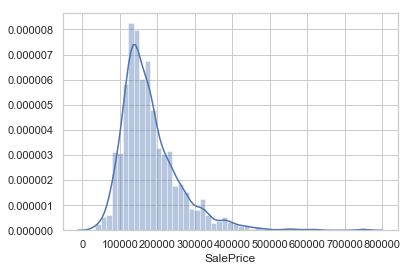

In [23]:
sns.distplot(dataset_train["SalePrice"])

In [24]:
#dataset_train["TransformedPrice"] = np.log(dataset_train["SalePrice"])
categorical_values_train = list(cat_train.index)
categorical_values_test = list(cat_test.index)

In [25]:
for i in categorical_values_train:
    feature_set = set(dataset_train[i])
    for j in feature_set:
        feature_list = list(feature_set)
        dataset_train.loc[dataset_train[i] == j, i] = feature_list.index(j)

for i in categorical_values_test:
    feature_set2 = set(dataset_test[i])
    for j in feature_set2:
        feature_list2 = list(feature_set2)
        dataset_test.loc[dataset_test[i] == j, i] = feature_list2.index(j)

In [26]:
dataset_test

,Id,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition
0,1461,20,1,11622,0,2,0,0,4,2,1,0,3,3,4,5,6,1961,1961,0,3,10,11,1,0.0,0,3,1,3,3,3,1,468.0,6,144.0,270.0,882.0,1,3,1,0,896,0,0,896,0.0,0.0,1,0,2,1,0,5,0,0,1,1961.0,1,1.0,730.0,3,4,2,140,0,0,0,120,0,0,6,2010,3,0
1,1462,20,4,14267,0,0,0,0,1,2,1,5,3,3,4,6,6,1958,1958,3,3,0,2,2,108.0,0,3,1,3,3,3,2,923.0,5,0.0,406.0,1329.0,1,3,1,0,1329,0,0,1329,0.0,0.0,1,1,3,1,2,6,0,0,1,1958.0,1,1.0,312.0,3,4,2,393,36,0,0,0,0,12500,6,2010,3,0
2,1463,60,4,13830,0,0,0,0,4,2,5,5,3,3,0,5,5,1997,1998,0,3,10,11,1,0.0,0,3,4,1,3,3,4,791.0,5,0.0,137.0,928.0,1,0,1,0,928,701,0,1629,0.0,0.0,2,1,3,1,0,6,0,1,1,1997.0,3,2.0,482.0,3,4,2,212,34,0,0,0,0,0,3,2010,3,0
3,1464,60,4,9978,0,0,0,0,4,2,5,5,3,3,0,6,6,1998,1998,0,3,10,11,2,20.0,0,3,4,3,3,3,4,602.0,5,0.0,324.0,926.0,1,2,1,0,926,678,0,1604,0.0,0.0,2,1,3,1,2,7,0,1,1,1998.0,3,2.0,470.0,3,4,2,360,36,0,0,0,0,0,6,2010,3,0
4,1465,120,4,5005,0,0,2,0,4,2,11,5,3,4,4,8,5,1992,1992,0,3,3,6,1,0.0,2,3,4,1,3,3,2,263.0,5,0.0,1017.0,1280.0,1,2,1,0,1280,0,0,1280,0.0,0.0,2,0,2,1,2,5,0,0,1,1992.0,2,2.0,506.0,3,4,2,0,82,0,0,144,0,0,1,2010,3,0
5,1466,60,4,10000,0,0,0,0,1,2,5,5,3,3,0,6,5,1993,1994,0,3,3,6,1,0.0,0,3,4,1,3,3,5,0.0,5,0.0,763.0,763.0,1,0,1,0,763,892,0,1655,0.0,0.0,2,1,3,1,0,7,0,1,1,1993.0,3,2.0,440.0,3,4,2,157,84,0,0,0,0,0,4,2010,3,0
6,1467,20,4,7980,0,0,0,0,4,2,5,5,3,3,4,6,7,1992,2007,0,3,3,6,1,0.0,0,0,4,1,3,3,2,935.0,5,0.0,233.0,1168.0,1,2,1,0,1187,0,0,1187,1.0,0.0,2,0,3,1,0,6,0,0,1,1992.0,3,2.0,420.0,3,4,2,483,21,0,0,0,0,500,3,2010,3,0
7,1468,60,4,8402,0,0,0,0,4,2,5,5,3,3,0,6,5,1998,1998,0,3,10,11,1,0.0,0,3,4,1,3,3,5,0.0,5,0.0,789.0,789.0,1,0,1,0,789,676,0,1465,0.0,0.0,2,1,3,1,0,7,0,1,1,1998.0,3,2.0,393.0,3,4,2,0,75,0,0,0,0,0,5,2010,3,0
8,1469,20,4,10176,0,2,0,0,4,2,5,5,3,3,4,7,5,1990,1990,0,3,3,6,1,0.0,0,3,4,1,3,2,4,637.0,5,0.0,663.0,1300.0,1,0,1,0,1341,0,0,1341,1.0,0.0,1,1,2,1,2,5,0,1,1,1990.0,1,2.0,506.0,3,4,2,192,0,0,0,0,0,0,2,2010,3,0
9,1470,20,4,8400,0,2,0,0,1,2,1,5,3,3,4,4,5,1970,1970,0,3,9,10,1,0.0,0,3,1,3,3,3,2,804.0,1,78.0,0.0,882.0,1,3,1,0,882,0,0,882,1.0,0.0,1,0,2,1,0,4,0,0,1,1970.0,3,2.0,525.0,3,4,2,240,0,0,0,0,0,0,4,2010,3,0


### Teste de acuracia

In [42]:
from sklearn.model_selection import train_test_split

#predictors = dataset_train.drop(["Id", "SalePrice", "TransformedPrice"], axis=1)
predictors = dataset_train.drop(["Id", "SalePrice"], axis=1)
#target = dataset_train["TransformedPrice"]
target = dataset_train["SalePrice"]
x_train, x_val, y_train, y_val = train_test_split(predictors, target, test_size = 0.22, random_state = 0)
X_test = dataset_test.drop(["Id"], axis=1)
model_svr = SVR(C=1.0, cache_size=200, coef0=0.1, degree=0, epsilon=0.9, gamma='scale',
    kernel='rbf', max_iter=-1, shrinking=True, tol=0.001, verbose=False)
model_svr.fit(x_train, y_train)
y_pred = model_svr.predict(X_test)

In [44]:
output_1

,SalePrice
0,169277.052498
1,187758.393989
2,183583.683570
3,179317.477511
4,150730.079977
5,177150.989247
6,172070.659229
7,175110.956520
8,162011.698832
9,160726.247831


In [45]:
#Saída
output_2 = pd.DataFrame({'SalePrice': y_pred })
output_2.to_csv('submission.csv', index=False)
output_2

,SalePrice
0,163007.593576
1,163021.557401
2,163029.895547
3,162994.990895
4,162953.943477
5,162994.951502
6,162976.005927
7,162979.637501
8,162996.800451
9,162977.798008


In [41]:
from sklearn.metrics import mean_squared_error
mean_squared_error(output_1, output_2)


534219202.17582643

In [31]:
knn = KNeighborsRegressor(n_neighbors=19)
knn.fit(x_train, y_train)
y_pred = knn.predict(X_test)

output = pd.DataFrame({'SalePrice': y_pred })
output.to_csv('submission2.csv', index=False)
output





,SalePrice
0,142992.105263
1,180642.105263
2,199752.631579
3,199596.842105
4,147118.684211
5,165572.368421
6,137881.578947
7,158839.315789
8,167594.736842
9,132593.842105


In [46]:
mean_squared_error(output, output_1)

2054990350.4165907